In [1]:
# Optional: mount your Google Drive account so you can store and access your data there 

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Practical on HYperrealistic neural coding of PERception (HYPER)

In this practical, you will get hands-on experience with neural encoding and neural decoding via the GAN latent space. You will be working in groups of two. The practical consists of the following parts: 

1.   PGGAN
2.   Dataset
3.   Neural encoding
4.   Neural decoding
5.   Your own experiment

We provide you with the MXNET implementation of NVIDIA's progressively grown generative adversarial network (PGGAN) generator network for face generation that was used in [the paper](https://www.nature.com/articles/s41598-021-03938-w). You can load generator.params from [here](https://drive.google.com/drive/u/1/folders/1OW0cfnoP8_tZBGWLbpiPPX81QH9pusjv). In the first and second part, you will familiarize yourselves with PGGAN and the (stimulus, response) dataset. In the third and fourth part, you will implement neural encoding (face2brain) and neural decoding (brain2face). In the last part, you will conduct your own experiment that you will write an "ultra-short" report on.

In [2]:
! pip install mxnet-cu112
! pip install nilearn
! pip install nibabel

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
from __future__ import annotations

import os
import pickle
from types import ModuleType
from typing import Tuple, Union

import matplotlib.pyplot as plt
from matplotlib import cm
import mxnet as mx
from mxnet import autograd, Context, gluon, nd, symbol
from mxnet.gluon import loss, nn
from mxnet.gluon.nn import Conv2D, Dense, HybridBlock, HybridSequential, LeakyReLU
from mxnet.gluon.parameter import Parameter
from mxnet.initializer import Zero
from mxnet.ndarray import NDArray
from mxnet.io import NDArrayIter
import numpy as np
import nibabel as nib
from nilearn import plotting
from PIL import Image
from scipy.stats import t, zscore
from sklearn.linear_model import RidgeCV

In [4]:
if mx.gpu:
    ctx = mx.gpu()
else:
    ctx = mx.cpu()

In [5]:
class Pixelnorm(HybridBlock):
    def __init__(self, epsilon: float = 1e-8) -> None:
        super(Pixelnorm, self).__init__()
        self.eps = epsilon

    def hybrid_forward(self, F, x) -> nd:
        return x * F.rsqrt(F.mean(F.square(x), 1, True) + self.eps)


class Bias(HybridBlock):
    def __init__(self, shape: Tuple) -> None:
        super(Bias, self).__init__()
        self.shape = shape
        with self.name_scope():
            self.b = self.params.get("b", init=Zero(), shape=shape)
            
    def hybrid_forward(self, F, x, b) -> nd:
        return F.broadcast_add(x, b[None, :, None, None])


class Block(HybridSequential):
    def __init__(self, channels: int, in_channels: int) -> None:
        super(Block, self).__init__()
        self.channels = channels
        self.in_channels = in_channels
        with self.name_scope():
            self.add(Conv2D(channels, 3, padding=1, in_channels=in_channels))
            self.add(LeakyReLU(0.2))
            self.add(Pixelnorm())
            self.add(Conv2D(channels, 3, padding=1, in_channels=channels))
            self.add(LeakyReLU(0.2))
            self.add(Pixelnorm())

    def hybrid_forward(self, F, x) -> nd:
        x = F.repeat(x, 2, 2)
        x = F.repeat(x, 2, 3)
        for i in range(len(self)):
            x = self[i](x)
        return x


class Generator(HybridSequential):
    def __init__(self) -> None:
        super(Generator, self).__init__()
        with self.name_scope():
            self.add(Pixelnorm())
            self.add(Dense(8192, use_bias=False, in_units=512))
            self.add(Bias((512,)))
            self.add(LeakyReLU(0.2))
            self.add(Pixelnorm())
            self.add(Conv2D(512, 3, padding=1, in_channels=512))
            self.add(LeakyReLU(0.2))
            self.add(Pixelnorm())
            self.add(Block(512, 512))
            self.add(Block(512, 512))
            self.add(Block(512, 512))
            self.add(Block(256, 512))
            self.add(Block(128, 256))
            self.add(Block(64, 128))
            self.add(Block(32, 64))
            self.add(Block(16, 32))
            self.add(Conv2D(3, 1, in_channels=16))

    def hybrid_forward(self, F: Union(nd, symbol), x: nd, layer: int) -> nd:
        x = F.Reshape(self[1](self[0](x)), (-1, 512, 4, 4))
        for i in range(2, len(self)):
            x = self[i](x)
            if i == layer + 7:
                return x
        return x

In [6]:
generator = Generator()
generator.load_parameters("/content/drive/MyDrive/School stuff/M1/Neurotechnology/Data/generator.params", ctx=ctx)

# PART 1: PGGAN

## Exercise 1: Latent2Face (5 points)
The latent input of PGGAN's generator consists of 512-dimensional hyperspheres where each dimension is independently Gaussian distributed with unit variance. Sample a random latent vector and generate a face by feeding it to the generator. The model expects an input of type [NDArray](https://mxnet.apache.org/versions/1.0.0/api/python/ndarray/ndarray.html) and a layer of type int (choose the last layer=9 if you want the generator to return the face image). If you are using GPU, don't forget to specify this when converting your input to NDArray.


In [61]:
latent = nd.random.normal(0, 1, shape=(1, 512)) 

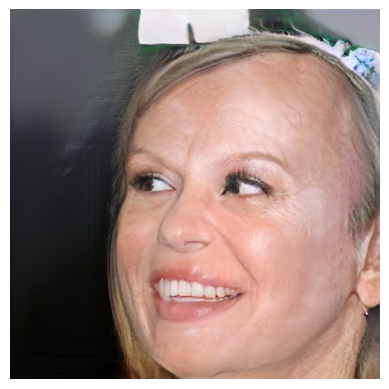

In [62]:
def show_face(latent):
  face = generator(nd.array(latent).as_in_context(ctx), 9).asnumpy() 
  face = np.clip(np.rint(127.5 * face + 127.5), 0.0, 255.0)
  face = face.astype("uint8").transpose(0, 2, 3, 1)

  plt.figure()
  plt.imshow(face[0])
  plt.axis("off")
  plt.show()

show_face(latent)

## Exercise 2: Spherical linear interpolation (5 points)

The GAN latent space has learned smooth transitions that can be visualized by linear interpolation. Because the latent space is a multimodal Gaussian distribution, the "spherical" linear interpolation function $Slerp$ should be used used to take the latents' spherical geometry into account (rather than regular linear interpolation):

\begin{equation}
    Slerp(z_1, z_2, n) = \frac{\sin \big[ (1-n) \Omega \big] }{\sin \Omega} z_1 + \frac{\sin \big[n \Omega \big] }{\sin \Omega} z_2
\end{equation}

where $\Omega$ is the subtended angle which you can compute by taking the dot product of the unit vectors of $z_1$ and $z_2$. That is, $\cos \Omega = z_1 \cdot z_2$. Next, $n$ is the interpolation ratio that you can get using <code>np.linspace(0, 1, N)</code> where $N$ is the step size. **What does the $Slerp$ function look like in the limit as $\Omega \to 0$?**

First, implement the $Slerp$ function which should return a latent vector. Then, sample two random latents $z_1$ and $z_2$ and use $Slerp$ to obtain N latents which you can feed to the generator to synthesize $N$ face images that transition smoothly from $z_1$ into $z_2$.

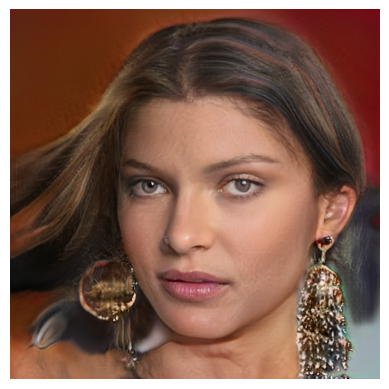

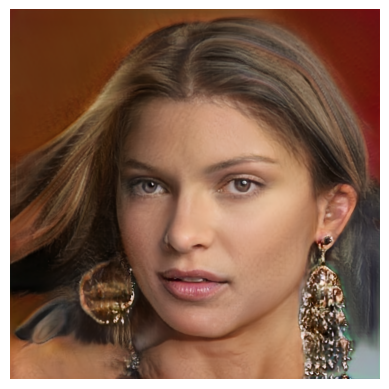

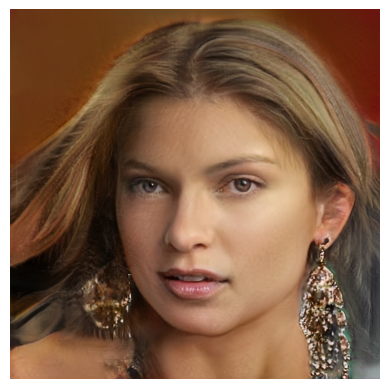

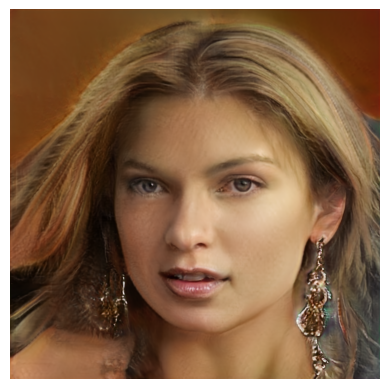

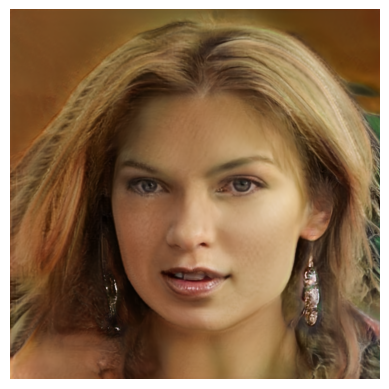

In [ ]:
def slerp(N, z1, z2):
    """
    Compute the spherical linear interpolation (SLERP) between two vectors in the latent space.
    
    Parameters:
    N (int): The number of intermediate latent vectors to generate.
    z1 (ndarray): The first latent vector (Numpy array of shape (latent_dim,)).
    z2 (ndarray): The second latent vector (Numpy array of shape (latent_dim,)).

    Returns:
    slerp_latents (ndarray): An array of shape (N, latent_dim) containing the interpolated latent vectors
                             from z1 to z2, including the endpoints.
"""


    z1 = np.ravel(z1) 
    z2 = np.ravel(z2)
    cos_omega = (np.dot(z1, z2))
    norm = np.linalg.norm(z1) * np.linalg.norm(z2)
    cos_omega = np.squeeze(np.divide(cos_omega, norm))
    omega = np.clip(np.arccos(cos_omega), -1, 1)

    n = np.linspace(0, 1, N)
    
    slerp_latents = []
    for step in n:
      w1 = np.sin((1 - step) * omega) / np.sin(omega)
      w2 = np.sin(step * omega) / np.sin(omega)
      slerp_latents.append(w1 * z1 + w2 * z2)

    return np.array(slerp_latents)


z1 = np.random.rand(1, 512)
z2 = np.random.rand(1, 512)
n = 5

slerp_latents = slerp(n, z1, z2)

for i in range(n):
  show_face((slerp_latents[i:i+1,:]))


## Exercise 3: Vector arithmetic (5 points)

In the previous exercise, you have seen how image semantics vary with the latent code. The GAN latent space also obeys simple arithmetic operations, such as:

$\texttt{SmilingWoman - NeutralWoman + NeutralMan = SmilingMan}$

Sample and reconstruct a large number of latents and reconstruct the corresponding faces. From these faces, select a bunch that correspond to each of the above three categories (i.e., 20 smiling women, 20 neutral women, 20 neutral men). Average their latents per categorie and perform the arithmetic function with these averaged latents to obtain a smiling man. If you are feeling creative, feel free to pick any other semantic face attribute instead of the given one (e.g., age or wearing eyeglasses).


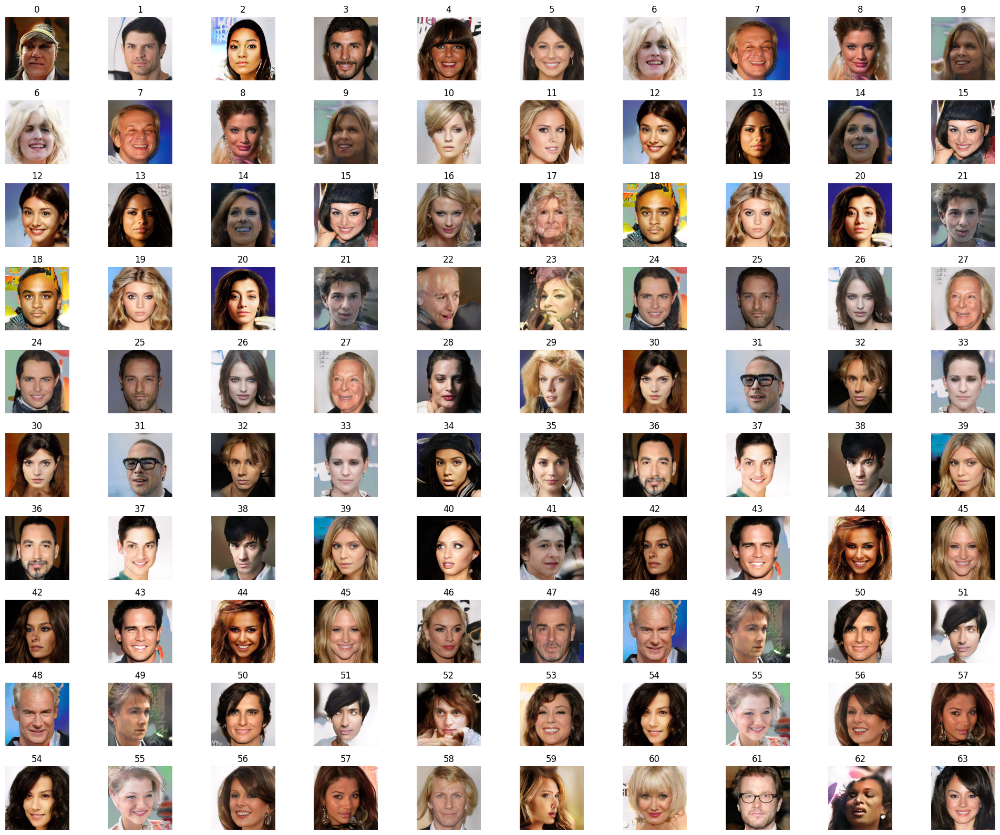

In [ ]:
num_latents = 100;
z_latent_all = nd.random.normal(0, 1, shape=(num_latents,512))

mx.random.seed(128)

faces = []

fig, axs = plt.subplots(10, 10, figsize = (20, 16))

for i in range(10):
    for j in range(10):
        idx = i * 6 + j
        if idx < num_latents:
            z_latent_current = z_latent_all[idx].reshape(1, 512)
            face = generator(nd.array(z_latent_current).as_in_context(ctx), 9).asnumpy()
            face = np.clip(np.rint(127.5 * face + 127.5), 0.0, 255.0)
            face = face.astype("uint8").transpose(0, 2, 3, 1)
            faces.append(face[0])
            axs[i, j].imshow(face[0])
            axs[i, j].axis("off")
            axs[i, j].set_title(str(idx))
        else:
            axs[i, j].set_visible(False)


plt.tight_layout()
plt.show()

In [ ]:
i_sm_wom=[]; i_nu_wom=[]; i_nu_man=[];
i_sm_wom = [1, 3, 4, 7, 11, 22, 23, 24, 26, 29, 30, 33, 41, 43, 50]; sm_woman = [z_latent_all[i] for i in i_sm_wom] 
i_nu_wom = [4, 9, 13, 20, 25, 28, 35, 39, 42, 45, 48, 49, 57]; nu_woman = [z_latent_all[i] for i in i_nu_wom] 
i_nu_man = [2, 12, 14, 15, 16, 19, 25, 38, 54]; neutral_man = [z_latent_all[i] for i in i_nu_man] 

/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:163: VisibleDeprecationWarning: Creating an ndarray from nested sequences exceeding the maximum number of dimensions of 32 is deprecated. If you mean to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = asanyarray(a)


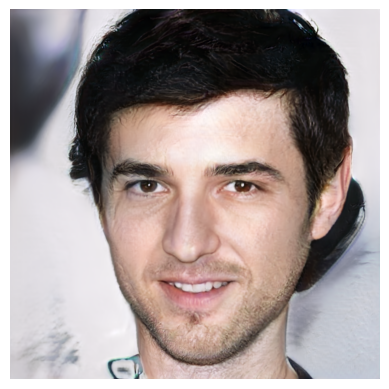

In [ ]:
SmilingWoman = np.mean(sm_woman, axis=0).reshape((1, 512))
NeutralMan = np.mean(neutral_man, axis=0).reshape((1, 512))
NeutralWoman = np.mean(nu_woman, axis=0).reshape((1, 512))

SmilingMan = SmilingWoman - NeutralWoman + NeutralMan

SmilingMan = SmilingMan.squeeze().tolist()
SmilingMan = [arr.asnumpy()[0] for arr in SmilingMan]
SmilingMan = np.array(SmilingMan).reshape(1, 512)
show_face(SmilingMan)

## Exercise 4: Semantic face editing (5 points)

In [this paper](https://arxiv.org/pdf/1907.10786.pdf), five decision boundaries are identified for five binary semantic attributes: gender, age, eyeglasses, pose and smile. A face can be edited by editing its underlying latent $z$:

\begin{equation}
    z_{edit} = z + \alpha \textbf{b}
\end{equation}

where $\alpha$'s magnitude and polarity represent the amount of change and direction, respectively, along the separation boundary $\textbf{b}$.

Pick a decision boundary for PGGAN from [their Github](https://github.com/genforce/interfacegan/tree/master/boundaries) and perform semantic face editing on a randomly sampled latent as follows: define a linspace of $n$ $\alpha$'s (E.g., <code>np.linspace(-3, 3, n)</code>) and subtract the dot product between latent and boundary from each element in this linspace. Finally, edit the original latent by adding each $\alpha \textbf{b}$ (as in the equation above) and visualize the $n$ corresponding faces.

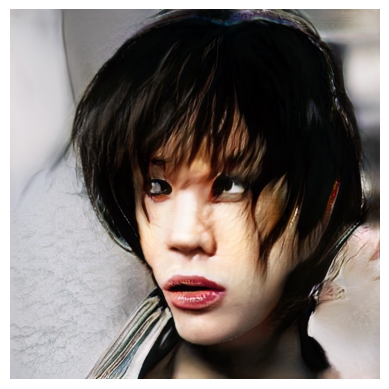

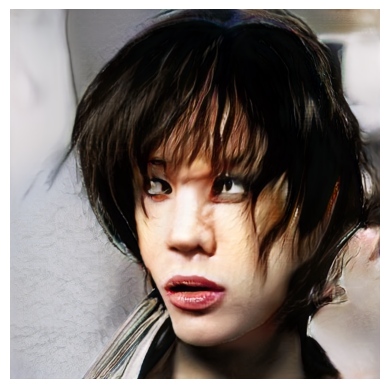

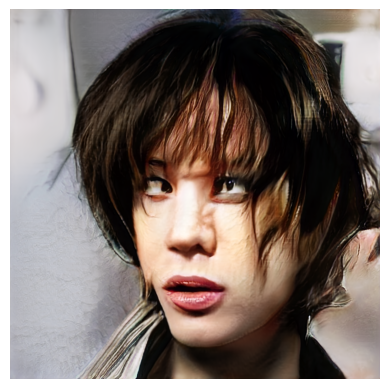

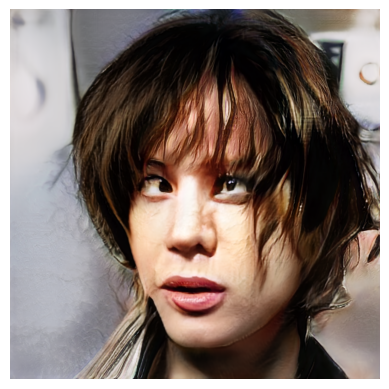

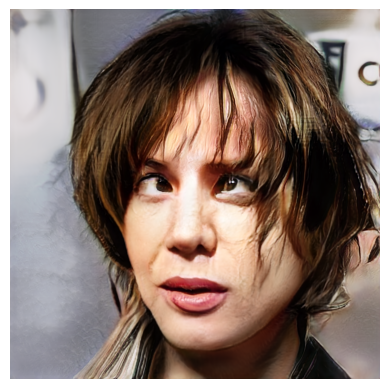

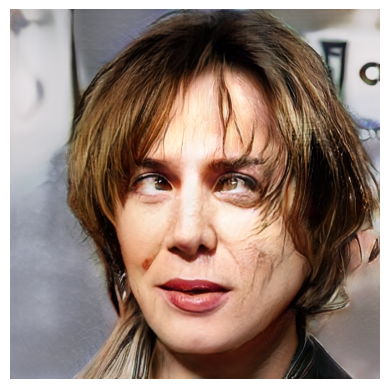

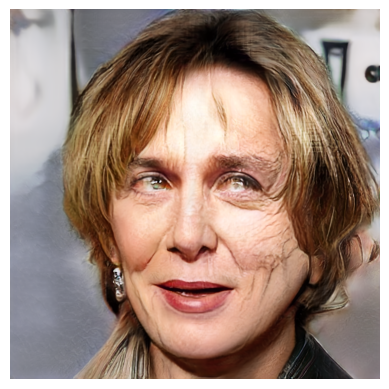

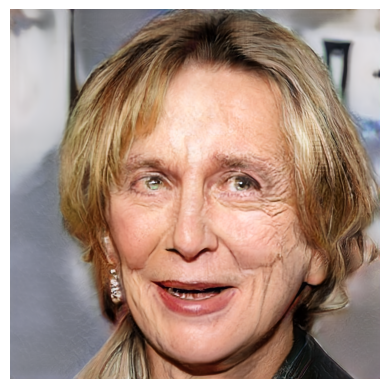

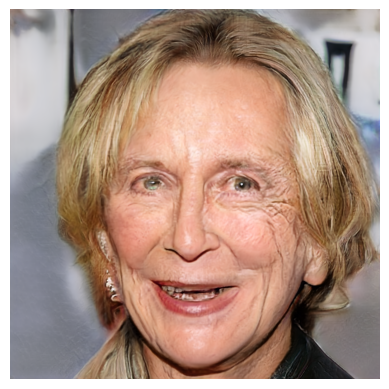

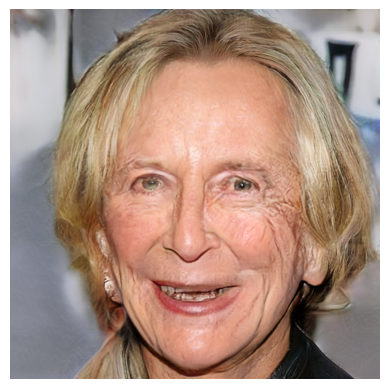

In [ ]:
boudary = np.load("/content/drive/MyDrive/School stuff/M1/Neurotechnology/pggan_celebahq_age_c_gender_boundary.npy")

n = 10

z = nd.random.normal(0, 1, shape=(1,512)).asnumpy()
a = np.linspace(-3, 3, n).reshape(n, 1)

dot_prod = np.dot(z, boudary.T) 
a_new = a - dot_prod
z_edit = z + np.dot(a_new, boudary)

for i in range(n):

    z_latent_current = z_edit[i].reshape(1, 512)
    show_face(z_latent_current)

# PART 2: Dataset



Load in the (latents, responses) dataset of **one participant** from [here](https://drive.google.com/drive/u/1/folders/1OW0cfnoP8_tZBGWLbpiPPX81QH9pusjv). The files from subject 1 and 2 are called data_1.dat and data_2.dat, respectively.

In [7]:
with open("/content/drive/MyDrive/School stuff/M1/Neurotechnology/data_1.dat", 'rb') as f:
    x_tr, t_tr, x_te, t_te = pickle.load(f)

## Exercise 5: Visual stimuli (5 points)

Generate the faces that correspond to the latents from the training and test set. These were the visual stimuli in the experiment. 

In [8]:
t_tr = np.array(t_tr)
t_te = np.array(t_te)
print(t_tr.shape, t_te.shape)

(1050, 512) (36, 512)


In [20]:
train_faces = []
test_faces = []

#for i in range(len(t_tr)):
#  z_current = t_tr[i].reshape(1, 512)
#  face_i = generator(nd.array(z_current).as_in_context(ctx), 9).asnumpy() 
#  face_i = np.clip(np.rint(127.5 * face_i + 127.5), 0.0, 255.0)
#  face_i = face_i.astype("uint8").transpose(0, 2, 3, 1)
#  train_faces.append(face_i)

for i in range(len(t_te)):
  z_current = t_tr[i].reshape(1, 512)
  face_i = generator(nd.array(z_current).as_in_context(ctx), 9).asnumpy() 
  face_i = np.clip(np.rint(127.5 * face_i + 127.5), 0.0, 255.0)
  face_i = face_i.astype("uint8").transpose(0, 2, 3, 1)
  test_faces.append(face_i)  

train_faces = np.array(train_faces)
test_faces = np.array(test_faces)

## Exercise 6: Brain responses (10 points)

We are going to plot the neural responses on the brain using [Nilearn's glass brain plotting](https://nilearn.github.io/dev/auto_examples/01_plotting/plot_demo_glass_brain.html). First, take the mean brain response of all the training set responses using np.mean(). Second, use [the mask coordinates](https://drive.google.com/drive/u/1/folders/1OW0cfnoP8_tZBGWLbpiPPX81QH9pusjv) to bring the 1D (4096) responses back to 3D (79, 95, 79). Lastly, use the affine transformation matrix from [the anatomical scan](https://openneuro.org/datasets/ds004280/versions/1.0.1) to align the responses on the glass brain visualization.

In [10]:
x_tr = np.array(x_tr)
x_te = np.array(x_te)
print("Training set:", x_tr.shape, "Test set:", x_te.shape)

Training set: (1050, 4096) Test set: (36, 4096)


In [ ]:
mean_resp = np.mean(x_tr, axis = 0).reshape(1, 4096)
mask_coords = np.load('/content/drive/MyDrive/School stuff/M1/Neurotechnology/mask_coord_1.npy')
output_array = np.zeros((79, 95, 79))

for i in range(mean_resp.shape[1]):
    x,y,z = mask_coords[i,:]
    output_array[x,y,z] = mean_resp[0][i]

atlas = nib.load("/content/drive/MyDrive/School stuff/M1/Neurotechnology/rMMP_in_MNI_symmetrical_1.nii")
atlas_affine = atlas.affine
nii = nib.Nifti1Image(output_array, atlas_affine)

## Exercise 7: Glasser brain atlas (5 points)

Load in the [glasser atlas "rMMP_in_MNI_symmetrical_1.nii"](https://drive.google.com/drive/u/1/folders/1OW0cfnoP8_tZBGWLbpiPPX81QH9pusjv) and visualize it using glass brain.
<br>
<br>

**Legend**

Early and intermediate visual cortex:<br>
1) Primary_Visual: 1.  
2) Early_Visual: 4, 5, 6.   
3) Dorsal_Stream_Visual: 13, 19, 3, 152, 16, 17.  
4) Ventral_Stream_Visual: 7, 163, 22, 18, 153, 160, 154.  
5) MT+_Complex_and_Neighboring_Visual_Areas: 158, 20, 21, 159, 156, 157, 23, 2, 138.     
   
Sensorimotor areas:<br>
6) Somatosensory_and_Motor: 8, 53, 9, 51, 52.   
7) Paracentral_Lobular_and_Mid_Cingulate: 40, 41, 55, 44, 43, 36, 39, 37.     
8) Premotor: 54, 96, 10, 56, 78, 11.  
9) Posterior_Opercular: 99, 113, 100, 101, 102, 105.      

Auditory regions:<br>
10) Early_Auditory: 24, 174, 173, 124, 104.   
11) Auditory_Association: 175, 125, 129, 128, 130, 176, 123, 107.     
12) Insular_and_Frontal_Opercular: 103, 178, 168, 167, 106, 115, 114, 116, 109, 111, 112, 110, 108, 169.  

Temporal cortex:<br>
13) Medial_Temporal: 120, 119, 118, 122, 126, 155, 127.  
14) Lateral_Temporal: 137, 133, 177, 132, 136, 134, 172, 131, 135.     

Posterior cortex:<br>
15) Temporo-Parieto-Occipital_Junction: 139, 140, 141, 28, 25.   
16) Superior_Parietal: 48, 95, 49, 117, 50, 47, 42, 45, 46, 29.  
17) Inferior_Parietal: 143, 151, 150, 149, 148, 116, 147, 146, 145, 144.  
18) Posterior_Cingulate: 142, 121, 31, 15, 14, 33, 34, 35, 161, 162, 32, 38, 27, 30.     

Anterior cortex:<br>
19) Anterior_Cingulate_and_Medial_Prefrontal: 58, 57, 59, 180, 61, 60, 179, 62, 64, 165, 63, 69, 88, 65, 164.   
20) Orbital_and_Polar_Frontal: 94, 66, 77, 91, 92, 89, 170, 90, 72, 93, 166.   
21) Inferior_Frontal: 74, 75, 80, 79, 81, 82, 76, 171.   
22) Dorsolateral_Prefrontal: 73, 67, 97, 98, 26, 70, 71, 87, 68, 83, 85, 84, 86.*


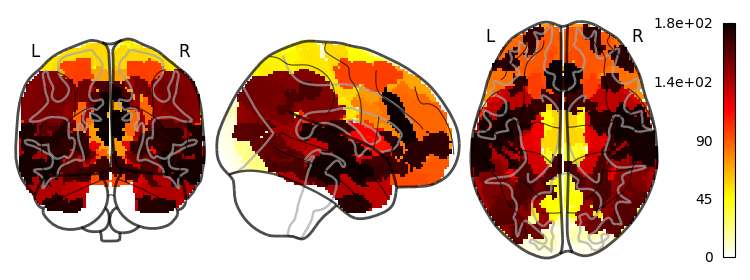

In [ ]:
atlas_img = nib.load("/content/drive/MyDrive/School stuff/M1/Neurotechnology/rMMP_in_MNI_symmetrical_1.nii")
plotting.plot_glass_brain(atlas_img, threshold = 0, colorbar = True, plot_abs = False)
plotting.show()

Now, visualize only the voxels from our voxel mask. Now we can see which brain regions are part of our voxel mask, and also count the number of voxels per brain region.

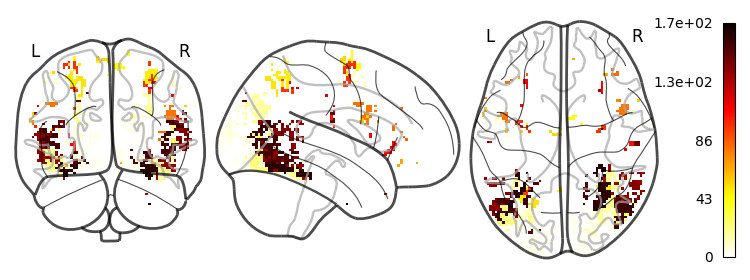

Region 1.0: 163 voxels
Region 2.0: 19 voxels
Region 3.0: 9 voxels
Region 4.0: 115 voxels
Region 5.0: 68 voxels
Region 6.0: 80 voxels
Region 7.0: 102 voxels
Region 8.0: 5 voxels
Region 9.0: 1 voxels
Region 11.0: 1 voxels
Region 12.0: 12 voxels
Region 13.0: 10 voxels
Region 16.0: 24 voxels
Region 17.0: 39 voxels
Region 18.0: 155 voxels
Region 19.0: 6 voxels
Region 20.0: 9 voxels
Region 21.0: 28 voxels
Region 22.0: 88 voxels
Region 23.0: 24 voxels
Region 28.0: 1 voxels
Region 40.0: 1 voxels
Region 43.0: 10 voxels
Region 44.0: 6 voxels
Region 45.0: 3 voxels
Region 47.0: 2 voxels
Region 48.0: 46 voxels
Region 49.0: 3 voxels
Region 50.0: 19 voxels
Region 54.0: 3 voxels
Region 55.0: 7 voxels
Region 56.0: 7 voxels
Region 65.0: 1 voxels
Region 66.0: 4 voxels
Region 73.0: 1 voxels
Region 74.0: 1 voxels
Region 78.0: 38 voxels
Region 79.0: 1 voxels
Region 80.0: 7 voxels
Region 81.0: 3 voxels
Region 82.0: 5 voxels
Region 83.0: 1 voxels
Region 86.0: 1 voxels
Region 95.0: 8 voxels
Region 96.0: 20 vox

In [ ]:
mask_coords = np.load('/content/drive/MyDrive/School stuff/M1/Neurotechnology/mask_coord_1.npy')
voxel_mask = np.zeros((79, 95, 79))
atlas_data = atlas_img.get_fdata()

for i in range(4096):
  x,y,z = mask_coords[i,:]
  voxel_mask[x,y,z] = atlas_data[x,y,z]

result = nib.Nifti1Image(voxel_mask, atlas_affine)
plotting.plot_glass_brain(result, threshold = 0, colorbar = True, plot_abs = False)
plotting.show()

voxel_count = np.unique(voxel_mask[voxel_mask != 0], return_counts=True)

for val, count in zip(voxel_count[0], voxel_count[1]):
    print(f"Region {val}: {count} voxels")

# PART 3: Neural encoding

## Exercise 8: Stimulus-feature model (10 points)

Alexnet is pretrained for object recognition. We can extract its intermediate feature representations to images. Feed it the images from the training and test set and extract the feature representations from multiple layers. Save them as numpy arrays.

In [11]:
class Alexnet(HybridBlock):
    def __init__(self, layer: int) -> None:
        super(Alexnet, self).__init__()
        self.layer = layer
        with self.name_scope():
            self.features = nn.HybridSequential("")
            with self.features.name_scope():
                if layer >= 1:
                    self.features.add(nn.Conv2D(64, 11, 4, 2, activation="relu"))
                    self.features.add(nn.MaxPool2D(3, 2))
                if layer >= 2:
                    self.features.add(nn.Conv2D(192, 5, padding=2, activation="relu"))
                    self.features.add(nn.MaxPool2D(3, 2))
                if layer >= 3:
                    self.features.add(nn.Conv2D(384, 3, padding=1, activation="relu"))
                if layer >= 4:
                    self.features.add(nn.Conv2D(256, 3, padding=1, activation="relu"))
                if layer >= 5:
                    self.features.add(nn.Conv2D(256, 3, padding=1, activation="relu"))
                    self.features.add(nn.MaxPool2D(3, 2))
                if layer >= 6:
                    self.features.add(nn.Flatten())
                    self.features.add(nn.Dense(4096, activation="relu"))
                    self.features.add(nn.Dropout(0.5))
                if layer >= 7:
                    self.features.add(nn.Dense(4096, activation="relu"))
                    self.features.add(nn.Dropout(0.5))
            if layer == 8:
                self.output = nn.Dense(1000)
        self.load_parameters("/content/drive/MyDrive/School stuff/M1/Neurotechnology/alexnet-44335d1f.params", ctx, ignore_extra=True)

    def transform(self, image):
        
        resized = mx.image.resize_short(image, 224)
        cropped, crop_info = mx.image.center_crop(resized, (224, 224))
        normalized = mx.image.color_normalize(cropped.astype(np.float32)/255,
                                        mean=mx.nd.array([0.485, 0.456, 0.406]),
                                        std=mx.nd.array([0.229, 0.224, 0.225]))
        transposed = normalized.transpose((2, 0, 1))
        batchified = transposed.expand_dims(axis=0)
        return batchified.as_in_context(ctx)
    
    def hybrid_forward(self, F: ModuleType, x: nd.NDArray) -> nd.NDArray:
        x = self.transform(x)
        return self.output(self.features(x)) if self.layer == 8 else self.features(x)


In [ ]:
for i in range(len(train_faces)):
    x = train_faces[i]
    ax = plt.imshow(x)
   
    #!mkdir '/content/drive/MyDrive/School stuff/M1/Neurotechnology/Train_Images'
    plt.savefig(f'/content/drive/MyDrive/School stuff/M1/Neurotechnology/Train_Images/{i}.png')
    plt.clf()

for i in range(len(test_faces)):
    x = train_faces[i]
    ax = plt.imshow(x)

    #!mkdir '/content/drive/MyDrive/School stuff/M1/Neurotechnology/Test_Images'
    plt.savefig(f'/content/drive/MyDrive/School stuff/M1/Neurotechnology/Test_Images/{i}.png')
    plt.clf()

In [ ]:
layers = [1,3,5,8]

#for i in range(150): #reducing training set to avoid memory issues
#    stimulus = mx.image.imread(f"/content/drive/MyDrive/School stuff/M1/Neurotechnology/Train_Images/{i}.png")

#    for layer in layers:       
#        feature_model = Alexnet(layer)
#        feature = feature_model(stimulus).asnumpy()
#        filename= f"/content/drive/MyDrive/School stuff/M1/Neurotechnology/Train_Images/train_faces_{i}_layer_{layer}.npy"
#        np.save(filename, feature)

#print(len(test_faces))
#for i in range(36):
#     stimulus = mx.image.imread(f"/content/drive/MyDrive/School stuff/M1/Neurotechnology/Test_Images/{i}.png")

#     for layer in layers:  
#         feature_model = Alexnet(layer)
#         feature = feature_model(stimulus).asnumpy()
#         filename = f"/content/drive/MyDrive/School stuff/M1/Neurotechnology/Test_Images/test_faces_{i}_layer_{layer}.npy"
#         np.save(filename, feature)

## Exercise 9: Feature-response model (10 points)

Fit a linear feature-response model on the extracted Alexnet features and responses from the training set using [Scikit's RidgeCV](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.RidgeCV.html) (play around with different alpha values). You could train different models for the voxels of different brain regions according to the Glasser atlas, but the main goal is to understand how to implement encoding models from feature representations. Train $k$ different models on features from $k$ different Alexnet layers.

Evaluate the predicted responses versus the target responses from the test set using pearson_correlation_coefficient() per voxel (i.e., each voxel has its own correlation coefficient). In the end, you should have $k$ correlation coefficients per voxel response, and assign the layer that resulted in the highest correlation coefficient to each voxel. Plot the your results (e.g., assigned layers or correlation coefficients, depending on what you're interested in) on the glass brain visualization.

In [12]:
def pearson_correlation_coefficient(x: np.ndarray, y: np.ndarray, axis: int) -> np.ndarray:
    r = (np.nan_to_num(zscore(x)) * np.nan_to_num(zscore(y))).mean(axis)
    p = 2 * t.sf(np.abs(r / np.sqrt((1 - r ** 2) / (x.shape[0] - 2))), x.shape[0] - 2)
    return r, p

In [ ]:
def Layer_RidgeCV(layer: int) :
  train_features = []
  train_responses = []  

  for i in range(150):
    features = np.ravel(np.load(f"/content/drive/MyDrive/School stuff/M1/Neurotechnology/Train_Images/train_faces_{i}_layer_{layer}.npy"))
    train_features.append(features.reshape(1, features.shape[0])) 
    response = x_tr[i].reshape(1, 4096)
    train_responses.append(response)

  tr_feat = np.squeeze(np.array(train_features), axis=1)
  tr_resp = np.squeeze(np.array(train_responses))

  model = RidgeCV(alphas = [1e-3, 1e-2, 1e-1, 1]).fit(tr_feat, tr_resp)

  test_features = []
  for i in range(35):
    features = np.ravel(np.load(f"/content/drive/MyDrive/School stuff/M1/Neurotechnology/Test_Images/test_faces_{i}_layer_{layer}.npy"))
    test_features.append(features.reshape(1,features.shape[0]))

  te_feat = np.squeeze(np.array(test_features),axis=1)

  C = model.predict(te_feat)

  r_s = np.empty((len(x_te), 4096))
  p_s = np.empty((len(x_te), 4096))
  
  for i in range(len(x_te) - 1):
    x = C[i]
    y = x_te[i]
    
    r = (np.nan_to_num(zscore(x)) * np.nan_to_num(zscore(y))).reshape(4096, 1).mean(0)
    p = 2 * t.sf(np.abs(r / np.sqrt((1 - r ** 2) / (x.shape[0] - 2))), x.shape[0] - 2)
    r_s[i] = r
    p_s[i] = p

  return C, r_s, p_s

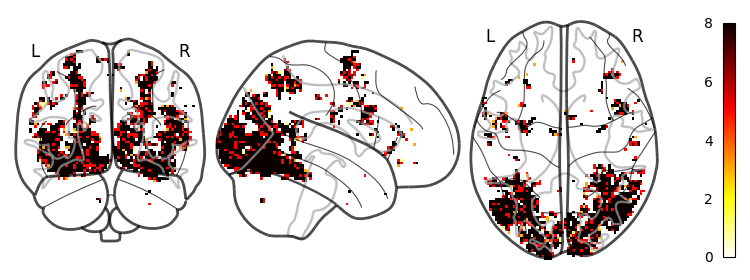

In [ ]:
C1, r1, p2 = Layer_RidgeCV(1)
C3, r3, p3 = Layer_RidgeCV(3)
C5, r5, p5 = Layer_RidgeCV(5)
C8, r8, p8 = Layer_RidgeCV(8)

mean1 = np.mean(r1, axis=0)
mean3 = np.mean(r3, axis=0)
mean5 = np.mean(r5, axis=0)
mean8 = np.mean(r8, axis=0)

stacked = np.stack([mean1, mean3, mean5, mean8], axis=1)
max_idx = np.argmax(stacked, axis=1)
best_array = np.array(['1', '3', '5', '8'])[max_idx]

mask_coords = np.load('/content/drive/MyDrive/School stuff/M1/Neurotechnology/mask_coord_1.npy')
output_array = np.zeros((79, 95, 79))

for i in range(len(best_array)):
    x,y,z = mask_coords[i,:]
    output_array[x,y,z] = best_array[i]

result = nib.Nifti1Image(output_array, atlas_affine)
plotting.plot_glass_brain(result, threshold=0, colorbar=True, plot_abs=False)
plotting.show()

# PART 4: Neural decoding

## Exercise 10: response-latent model (10 points)

Fit a linear response-feature decoding model that predicts latents from brain responses. How does your model performance change as a function of regularization? Feed your predicted latents to the generator and report your reconstruction performance (e.g., latent similarity, feature similarity or pearson's correlation coefficient over pixels).

In [ ]:
def latent_similarity(response, test_latent, alpha):
  model = RidgeCV(alpha).fit(x_tr, t_tr)
  r = np.zeros(36)
  for i in range(len(test_latent)):
    pred_latent = model.predict(response[i].reshape(1, -1))
    pred_latent = pred_latent.squeeze()
    vldn_lat_i = test_latent[i]

    r[i], _ = pearson_correlation_coefficient(pred_latent, vldn_lat_i, 0)

  return r.mean()

r_total = np.zeros(10)
alphas = np.logspace(-5, 5, num=10)

for i in range(len(alphas)):
  r_total[i] = latent_similarity(x_te, t_te, alphas[i])


for val, count in zip(alphas, r_total):
    print(f"Alpha {val}, r = {count} ")

Alpha 1e-05, r = 0.012325233571485718 
Alpha 0.0001291549665014884, r = 0.012325234912578732 
Alpha 0.0016681005372000592, r = 0.012325252233427784 
Alpha 0.021544346900318846, r = 0.012325475934264078 
Alpha 0.2782559402207126, r = 0.01232836405124675 
Alpha 3.593813663804626, r = 0.012365484717760564 
Alpha 46.41588833612782, r = 0.01281693014455209 
Alpha 599.4842503189421, r = 0.016233972137760497 
Alpha 7742.636826811277, r = 0.021272702054326836 
Alpha 100000.0, r = 0.017799612831085287 


## Exercise 11: reconstruction (10 points)

Feed your predicted latents to the generator and report your reconstruction performance (e.g., feature similarity or pearson's correlation coefficient over pixels).

In [13]:
def generate_images(latents):
    images = []
    for i in range(len(latents)):
        
        latent = latents[i].reshape(1,-1)
        face = generator(nd.array(latent).as_in_context(ctx), 9).asnumpy()
        face = np.clip(np.rint(127.5 * face + 127.5), 0.0, 255.0)
        face = face.astype("uint8").transpose(0, 2, 3, 1)
        images.append(face[0].squeeze())

    return np.array(images)

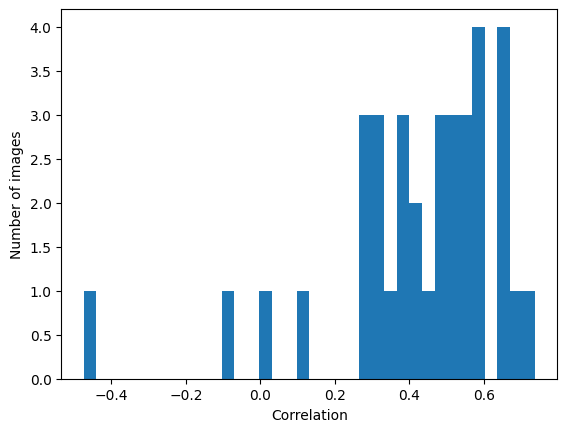

In [52]:
validation_latents = t_te; validation_responses = x_te
model = RidgeCV(0.001).fit(x_tr, t_tr)
predicted_latents = model.predict(x_te)

images1 = generate_images(predicted_latents)
images2 = generate_images(validation_latents)

correlations = []

for i in range(len(images1)):
    img1 = images1[i]
    img2 = images2[i]
    r, _ = pearson_correlation_coefficient(img1.flatten(), img2.flatten(), axis=None)
    correlations.append(r)

correlations = np.array(correlations)
plt.hist(correlations, bins = len(images1))
plt.xlabel('Correlation')
plt.ylabel('Number of images')
plt.show()

In [53]:
print(correlations)
print(np.mean(correlations))
print(np.std(correlations))

[ 0.49599204  0.36783546  0.53602861  0.46996525  0.59521381  0.50285705
  0.27780893  0.58121385  0.325686    0.2801816   0.52875657  0.30617814
  0.42561274  0.37116622  0.57329822  0.01587369  0.33895664  0.66480752
  0.48936592  0.6799765   0.27868595  0.40622239  0.65375154  0.52194311
  0.45120582  0.6658733   0.57920566  0.55357426 -0.47412587  0.31446107
  0.55838049  0.37091135  0.73690948  0.63985079 -0.09114582  0.1312544 ]
0.420103685975408
0.23599462955497347


# PART 5: Your experiment 

## Exercise 12: report (20 points)

Now that you have mastered the basics, you can perform your own experiment with this dataset of brain responses to synthesized stimuli. Write an "ultra-short" (800-1,600 words) report on your experiment where you state your research question, methods, results and discussion.

### Food for thought / research ideas:

*   Improve reconstructions with a custom loss function. In addition to mean squared error between predicted and real latent, also add other loss terms (e.g., structural similarity index, Alexnet/VGGFace features)

*   Linear interpolation of fMRI responses
*   Vector arithmetic with fMRI responses
*   Neural encoding using VGGFace features for face recognition
*   Neural encoding: predict custum face attributes (e.g., emotional expression) by averaging many latents (as in exercise 3) or training your own SVM (as in exercise 4).
*   Neural encoding / decoding from voxels in specific brain areas according to the Glasser atlas










In [14]:
#!pip uninstall keras
#!pip uninstall keras_vggface
#!pip install keras==2.2.4
#!pip install keras_vggface
#!pip install scikit-image
#!git clone https://github.com/rcmalli/keras-vggface.git
#!cd keras-vggface && python setup.py install

from keras.applications.vgg16 import VGG16, preprocess_input
import keras.applications.vgg16 as vgg16
from sklearn.metrics import make_scorer
from skimage.metrics import structural_similarity as ssim

vgg_model = VGG16(weights='imagenet', include_top=False)

In [45]:
def resp2latent(response):

    model = RidgeCV(0.001).fit(x_tr, t_tr)
    pred = model.predict(response)

    return pred

def generate_faces(latents):
    images = []
    for i in range(len(latents)):
        
        latent = latents[i].reshape(1, -1)
        face = generator(nd.array(latent).as_in_context(ctx), 9).asnumpy()
        face = np.clip(np.rint(127.5 * face + 127.5), 0.0, 255.0)
        face = face.astype("uint8").transpose(0, 2, 3, 1)
        images.append(face[0].squeeze())

    return np.array(images)

In [46]:
# Due to Colab running out of free memory, we take a subset
predicted_latents = resp2latent(x_tr[0:200])
validation_latents = t_tr[0:200]

def custom_loss_vgg16(y_true, y_pred):
    total_loss = np.empty((1, len(y_pred)))

    y = generate_images(predicted_latents)
    y_val = generate_images(validation_latents) 

    for index in range(len(y_val) - 1):
      
      y_i = y_val[index]
      y_hat_i = y[index]

      x_vgg_feat = vgg_model.predict(np.expand_dims(y_i, axis=0))
      y_vgg_feat = vgg_model.predict(np.expand_dims(y_i, axis=0))
      vgg_loss = np.mean(np.square(x_vgg_feat - y_vgg_feat))
      
      total_loss[0][index] = vgg_loss

    return total_loss

In [47]:
custom_score = make_scorer(custom_loss_vgg16, greater_is_better = False)

In [48]:
clf = RidgeCV(1e-3, scoring = custom_score).fit(x_tr, t_tr)

1/1 [==============================] - 0s 24ms/step


In [49]:
clf.score(x_tr, t_tr)
y_te = clf.predict(x_te) 

y_te_im = generate_faces(y_te)

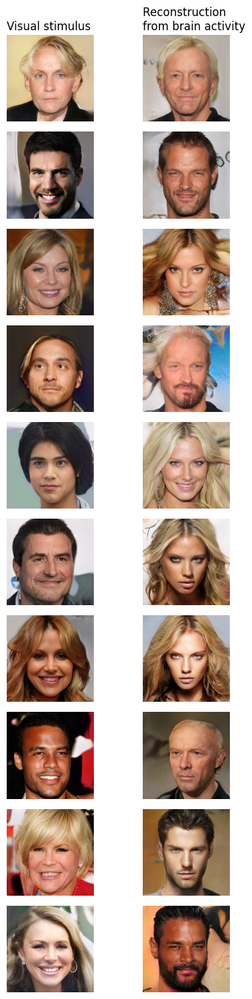

In [50]:
fig, axs = plt.subplots(10, 2, figsize=(5, 15))
for i, index in enumerate(range(10)): 
    axs[i, 0].imshow((test_faces[index]).squeeze()) 
    axs[i, 0].axis("off")
    axs[0, 0].set_title("Visual stimulus", loc="left")
    axs[i, 1].imshow((y_te_im[index]))
    axs[i, 1].axis("off")
    axs[0, 1].set_title("Reconstruction \nfrom brain activity", loc="left")
plt.tight_layout()
plt.show()

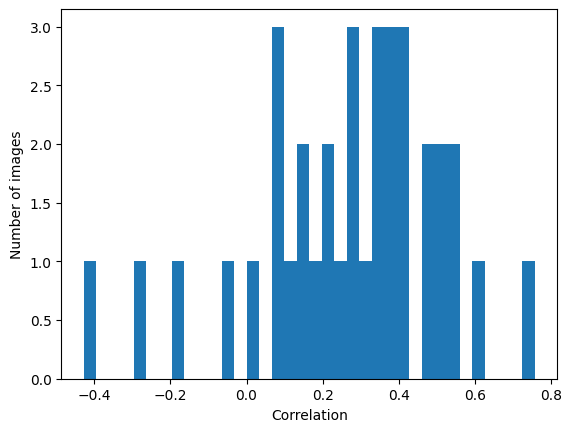

0.2653402417835347
0.24443909209860276


In [51]:
correlations = []

for i in range(len(test_faces)):
    img1 = test_faces[i]
    img2 = y_te_im[i]
    r, _ = pearson_correlation_coefficient(img1.flatten(), img2.flatten(), axis=None)
    correlations.append(r)

correlations = np.array(correlations)
plt.hist(correlations, bins = len(test_faces))
plt.xlabel('Correlation')
plt.ylabel('Number of images')
plt.show()

print(np.mean(correlations))
print(np.std(correlations))